In [13]:
import numpy as np
import tifffile
import gc
from scipy import ndimage
import skimage as ski
from sklearn.linear_model import RANSACRegressor
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.optimize import curve_fit

In [4]:
# --- FUNCTION 1: WRINKLED BIOFILMS (Meniscus/Polynomial Correction) ---
def get_z(rep, biofilm_no, plot = False):
    address = rf"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n={rep}\{biofilm_no}.tiff"
    
    # 1. Load and downcast
    tiff_stack = tifffile.imread(address).astype(np.float32)
    tiff_stack = np.transpose(tiff_stack, (2, 0, 1, 3))
    weights = np.array([0.299, 0.587, 0.114], dtype=np.float32)
    tiff_gray = tiff_stack[..., :3] @ weights
    del tiff_stack
    gc.collect()
    
    # Normalize and cleanup
    t_min, t_max = np.min(tiff_gray), np.max(tiff_gray)
    tiff_8bit = (((tiff_gray - t_min) / (t_max - t_min)) * 255).astype(np.uint8)
    tiff_8bit[930:970, :, 180:230] = 0 
    
    # 2. Masking
    threshold = 100
    tiff_stack_mask = (tiff_8bit > threshold)
    tiff_stack_open = ndimage.binary_opening(ndimage.median_filter(tiff_stack_mask, size=3))
    
    mask_path = rf"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\Masks\n={rep}\{biofilm_no} mask.tif"
    mask = tifffile.imread(mask_path).astype(bool)

    # 3. Height Calculation
    has_signal = np.any(tiff_stack_open, axis=2)
    raw_argmax = np.argmax(tiff_stack_open, axis=2)
    z_map_raw = np.where(has_signal, 225 - raw_argmax, 0).astype(float)

    missing_signal_in_mask = mask & ~has_signal
    local_mean_height = ndimage.uniform_filter(z_map_raw, size=11)
    z_for_fitting = np.where(missing_signal_in_mask, local_mean_height, z_map_raw)
    z_for_fitting = np.where(mask, z_for_fitting, 0)
   
    # 4. Polynomial Baseline Fix (Optimized for Wrinkles)
    z_floor = ndimage.minimum_filter(z_for_fitting, size=40)
    y_idx, x_idx = np.where(mask)
    z_floor_values = z_floor[y_idx, x_idx]

    valid_points = (z_floor_values > 0) & (z_floor_values < 120)
    if not np.any(valid_points): valid_points = z_floor_values >= 0

    x_train, y_train, z_train = x_idx[valid_points], y_idx[valid_points], z_floor_values[valid_points]

    X_train = np.stack([x_train, y_train, x_train**2, y_train**2, x_train*y_train, x_train**3, y_train**3], axis=1)
    X_all = np.stack([x_idx, y_idx, x_idx**2, y_idx**2, x_idx*y_idx, x_idx**3, y_idx**3], axis=1)

    model = RANSACRegressor(min_samples=0.1, residual_threshold=5) 
    model.fit(X_train, z_train)
    baseline_predictions = model.predict(X_all)

    baseline_2d = np.zeros_like(z_for_fitting)
    baseline_2d[y_idx, x_idx] = baseline_predictions

    # 5. Subtract and Cleanup
    flattened_z_map = np.where(mask, z_for_fitting - baseline_2d, 0)
    if biofilm_no == 12:
        data_pre = np.maximum(0, flattened_z_map)
        local_avg = ndimage.uniform_filter(data_pre, size=50)
        diff = data_pre - local_avg
        outliers = (diff > 5) & mask
        data_cleaned = np.where(outliers, local_avg, data_pre)
        data_final = ndimage.median_filter(data_cleaned, size=5)
        data_final = np.where(mask, data_final, np.nan)
    
    else:
        data_final = np.maximum(0, flattened_z_map)
        data_final = np.where(mask, data_final, np.nan)

    if plot == True:
        visualize(data_final, rep, biofilm_no)
    return data_final


In [5]:
# --- FUNCTION 2: DOME BIOFILMS (Rim-Anchor / Linear Correction) ---
def get_z_dome(rep, biofilm_no, plot = False):
    address = rf"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n={rep}\{biofilm_no}.tiff"
    
    # 1. Load and downcast
    tiff_stack = tifffile.imread(address).astype(np.float32)
    tiff_stack = np.transpose(tiff_stack, (2, 0, 1, 3))
    weights = np.array([0.299, 0.587, 0.114], dtype=np.float32)
    tiff_gray = tiff_stack[..., :3] @ weights
    del tiff_stack
    gc.collect()
    
    # Normalize and cleanup
    t_min, t_max = np.min(tiff_gray), np.max(tiff_gray)
    tiff_8bit = (((tiff_gray - t_min) / (t_max - t_min)) * 255).astype(np.uint8)
    tiff_8bit[930:970, :, 180:230] = 0 
    
    # 2. Masking
    threshold = 100
    tiff_stack_mask = (tiff_8bit > threshold)
    tiff_stack_open = ndimage.binary_opening(ndimage.median_filter(tiff_stack_mask, size=3))

    mask_path = rf"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\Masks\n={rep}\{biofilm_no} mask.tif"
    mask = tifffile.imread(mask_path).astype(bool)

    # 3. Height Calculation
    has_signal = np.any(tiff_stack_open, axis=2)
    raw_argmax = np.argmax(tiff_stack_open, axis=2)
    z_map_raw = np.where(has_signal, 225 - raw_argmax, 0).astype(float)

    missing_signal_in_mask = mask & ~has_signal
    local_mean_height = ndimage.uniform_filter(z_map_raw, size=11)
    z_for_fitting = np.where(missing_signal_in_mask, local_mean_height, z_map_raw)
    z_for_fitting = np.where(mask, z_for_fitting, 0)

    # 4. Rim-Anchor Baseline Fix (Optimized for Domes)
    eroded_mask = ndimage.binary_erosion(mask, iterations=1)
    rim_mask = mask ^ eroded_mask 
    y_rim, x_rim = np.where(rim_mask & (z_map_raw > 0))
    z_rim = z_map_raw[y_rim, x_rim]

    X_train = np.stack([x_rim, y_rim], axis=1)
    model = RANSACRegressor(residual_threshold=2) 
    model.fit(X_train, z_rim)

    y_full, x_full = np.indices((1000, 1000))
    X_all = np.stack([x_full.ravel(), y_full.ravel()], axis=1)
    baseline_2d = model.predict(X_all).reshape(1000, 1000)

    # 5. Spike Filter & Final Nan Mask
    flattened_z_map = np.where(mask, z_for_fitting - baseline_2d, 0)
    data_pre = np.maximum(0, flattened_z_map)
    
    local_avg = ndimage.uniform_filter(data_pre, size=50)
    diff = data_pre - local_avg
    outliers = (diff > 5) & mask
    data_cleaned = np.where(outliers, local_avg, data_pre)
    data_final = ndimage.median_filter(data_cleaned, size=5)
    data_final = np.where(mask, data_final, np.nan)

    if plot == True:
        visualize(data_final, rep, biofilm_no)
        
    return data_final



In [6]:
def visualize(flattened, rep, biofilm_no):
    z_mm_factor = 1.3483 / 225
    x_coords = np.linspace(0, 6.0, 1000)
    y_coords = np.linspace(0, 6.0, 1000)
    
    fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'surface'}]])

    fig.add_trace(go.Surface(z=flattened * z_mm_factor, x=x_coords, y=y_coords, colorscale='Viridis',
                             colorbar=dict(title='Height (mm)', x=1.0, thickness=15, len=0.5)), row=1, col=1)

    fig.update_layout(title_text = f"Biofilm {biofilm_no} surface",height=600, width=800,
                      scene1=dict(aspectmode='data', camera=dict(eye=dict(x=1.8, y=1.8, z=1))))
    fig.write_html(rf"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\Extracted surfaces {rep}\biofilm_3D {biofilm_no} surface.html", include_mathjax='cdn')
    fig.show()


In [7]:
def plot_biofilm_grid(surfaces_reloaded, rep, save=False):
    # 1. Define your custom layout matrix
    grid_indices = [[1,2,3,4,5],[16, 20, 22, 17, 6],[15,25,18,23,7],[14,19,24,21,8],[13, 12, 11 ,10,9]]
    
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Arial']

    # 2. Initialize the 5x5 figure
    # A 5x5 grid needs more width to accommodate the colorbar
    fig, axes = plt.subplots(5, 5, figsize=(15, 14), dpi=300) 
    
    current_cmap = plt.cm.RdBu_r.copy()
    current_cmap.set_bad(color='white')

    # Global min/max for a consistent colorbar across all 25 plots
    v_min, v_max = 0, np.nanmax(surfaces_reloaded * (1.3483 / 225))

    # 3. Loop through the grid
    for r in range(5):
        for c in range(5):
            ax = axes[r, c]
            biofilm_idx = grid_indices[r][c]
            
            # Extract and scale data
            image_data = surfaces_reloaded[biofilm_idx-1]
            if image_data is not None:
                image_float = np.array(image_data, dtype=float) * (1.3483 / 225)
                
                im = ax.imshow(image_float, 
                               cmap=current_cmap,
                               extent=[0, 6, 0, 6], 
                               origin='lower',
                               vmin=v_min, vmax=v_max)
            
            # Formatting each subplot
            ax.set_aspect('equal')
            
            # PNAS Style: Only show labels on the outer edges of the grid
            if c == 0: ax.set_ylabel('y (mm)', fontsize=9)
            else: ax.set_yticklabels([])
                
            if r == 4: ax.set_xlabel('x (mm)', fontsize=9)
            else: ax.set_xticklabels([])

            ax.tick_params(labelsize=8)
            ax.spines[['top', 'right']].set_visible(False)

    # 4. Add the single shared colorbar
    # We use 'fig.add_axes' to place it manually on the right
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7]) 
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label('Height (mm)', fontsize=12, fontweight='bold')
  
    plt.subplots_adjust(left=0.08, right=0.90, top=0.95, bottom=0.08, wspace=0.1, hspace=0.3)

    if save:
        path = rf'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n={rep}\Biofilm_5x5_Grid_PNAS.svg'
        plt.savefig(path, format="svg",dpi = 600, bbox_inches='tight')
    
    plt.show()


In [ ]:
#Extracting surfaces of n=1 replicate
surfaces_1 = []
for i in tqdm(range(1, 26)):
    try:
        if i in [9, 10, 11, 16]:
            surfaces_1.append(get_z_dome(rep=1, biofilm_no=i, plot = True))
        else:
            surfaces_1.append(get_z(rep=1, biofilm_no=i, plot = True))
    except Exception as e:
        print(f"Error on biofilm {i}: {e}")
        surfaces_1.append(None)
    print(f"Completed surface computation for biofilm:{i}")


  0%|                                                                                           | 0/25 [00:00<?, ?it/s]C:\Users\ayantis\AppData\Local\anaconda3\Lib\site-packages\kaleido\_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.

You can however, use the Kaleido API directly which will work with your plotly version. `kaleido.write_fig(...)`, for example. Please see the kaleido documentation.




In [ ]:
#Extracting surfaces of n=2 replicate
surfaces_2 = []
for i in tqdm(range(1, 26)):
    try:
        if i in [9, 10, 11, 16]:
            surfaces_2.append(get_z_dome(rep=2, biofilm_no=i, plot = True))
        else:
            surfaces_2.append(get_z(rep=2, biofilm_no=i, plot = True))
    except Exception as e:
        print(f"Error on biofilm {i}: {e}")
        surfaces.append(None)
    print(f"Completed surface computation for biofilm:{i}")


In [ ]:
#Extracting surfaces of n=3 replicate
surfaces_3 = []
for i in tqdm(range(1, 26)):
    try:
        if i in [9, 10, 11, 16]:
            surfaces_3.append(get_z_dome(rep=3, biofilm_no=i, plot = True))
        else:
            surfaces_3.append(get_z(rep=3, biofilm_no=i, plot = True))
    except Exception as e:
        print(f"Error on biofilm {i}: {e}")
        surfaces.append(None)
    print(f"Completed surface computation for biofilm:{i}")
    


In [ ]:
surfaces_array1 = np.array(surfaces_1, dtype=object)
np.savez_compressed(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep1.npz', surfaces=surfaces_array1)

print("All surfaces saved to biofilm_surfaces_rep1.npz")

In [ ]:
surfaces_array2 = np.array(surfaces_2, dtype=object)
np.savez_compressed(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep2.npz', surfaces=surfaces_array2)

print("All surfaces saved to biofilm_surfaces_rep2.npz")

In [ ]:
surfaces_array3 = np.array(surfaces_3, dtype=object)
np.savez_compressed(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep3.npz', surfaces=surfaces_array1)

print("All surfaces saved to biofilm_surfaces_rep3.npz")

In [8]:
loaded1 = np.load(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep1.npz', allow_pickle=True)
surfaces1_reloaded = loaded1['surfaces']

loaded2 = np.load(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep2.npz', allow_pickle=True)
surfaces2_reloaded = loaded2['surfaces']

loaded3 = np.load(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\biofilm_surfaces_rep3.npz', allow_pickle=True)
surfaces3_reloaded = loaded3['surfaces']


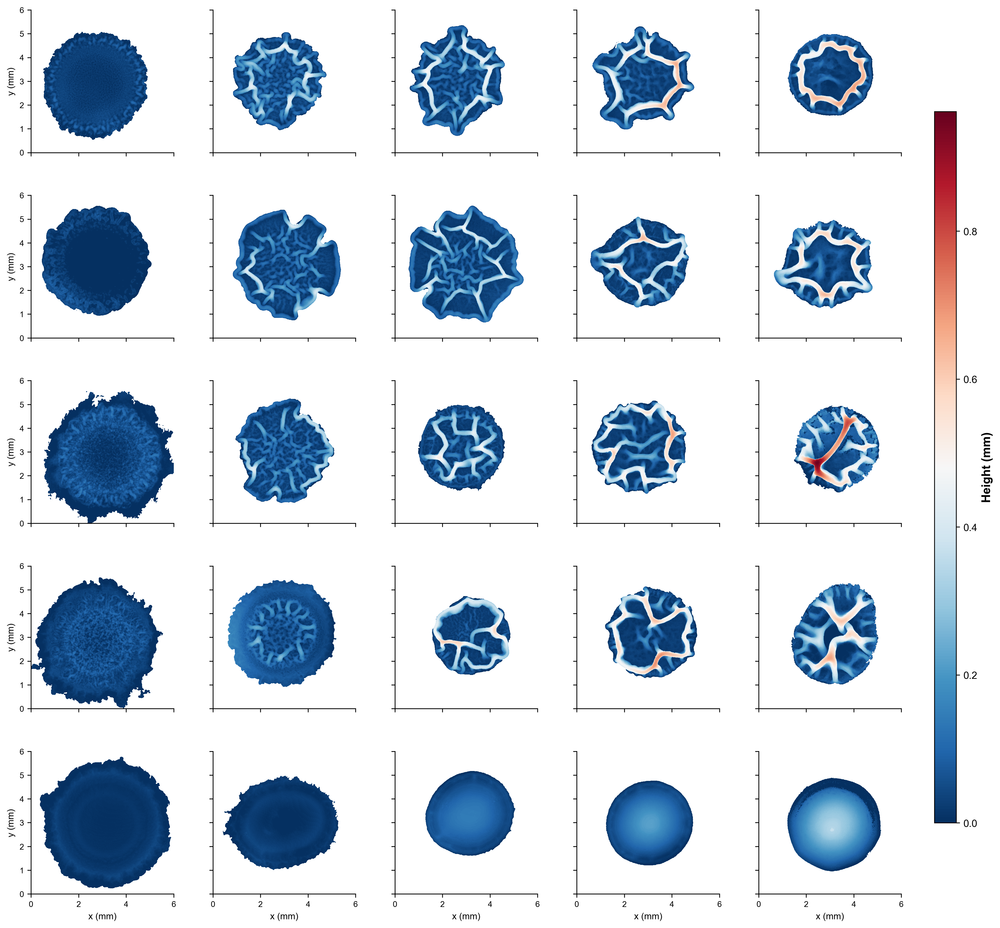

In [9]:
plot_biofilm_grid(surfaces1_reloaded, 1, save=True)

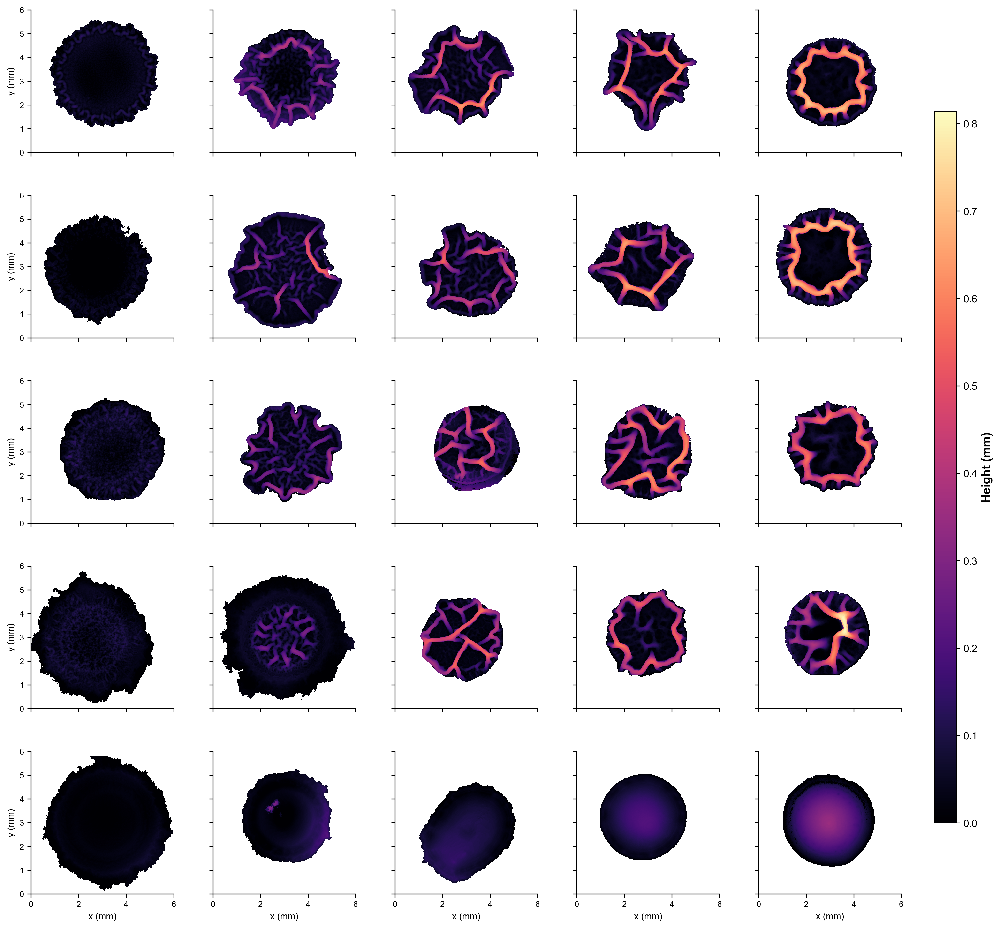

In [7]:
plot_biofilm_grid(surfaces2_reloaded, 2, save=True)

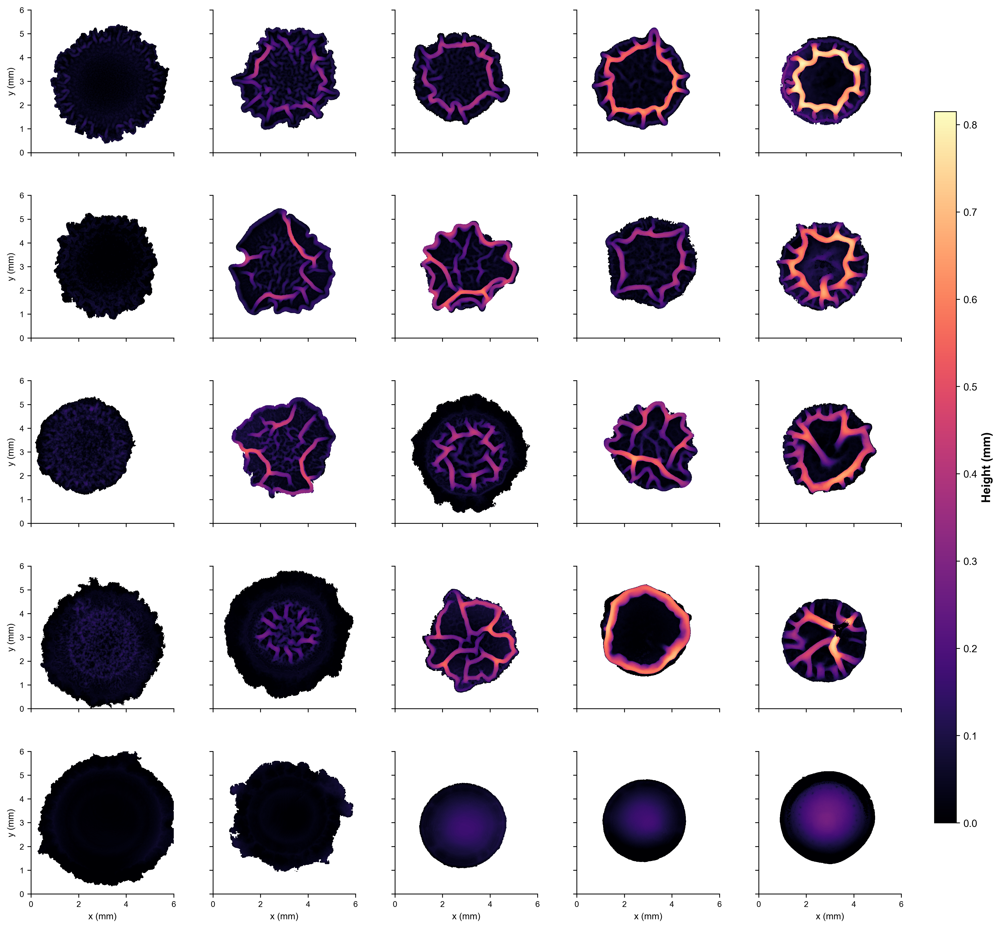

In [9]:
plot_biofilm_grid(surfaces3_reloaded, 3, save=True)

In [10]:
def paraboloid_dome(coords, x0, y0, z0, R):
    """
    Equation of a dome: z = z0 - ((x-x0)^2 + (y-y0)^2) / (2*R)
    Restricted to z >= 0 so it doesn't invert past the base.
    """
    x, y = coords
    z = z0 - ((x - x0)**2 + (y - y0)**2) / (2 * R)
    return np.maximum(z, 0)

def find_dome_sd(height_map):
    ny, nx = height_map.shape
    x_indices = np.arange(nx)
    y_indices = np.arange(ny)
    X, Y = np.meshgrid(x_indices, y_indices)

    valid_mask = ~np.isnan(height_map)

    x_valid = X[valid_mask]
    y_valid = Y[valid_mask]
    z_valid = height_map[valid_mask]

    x0_guess = np.mean(x_valid)
    y0_guess = np.mean(y_valid)
    z0_guess = np.max(z_valid)
    R_guess = 50.0  # Initial guess for curvature radius

    initial_guess = [x0_guess, y0_guess, z0_guess, R_guess]

    coords_valid = np.vstack((x_valid, y_valid))

    popt, pcov = curve_fit(paraboloid_dome, coords_valid, z_valid, p0=initial_guess)
    x0_fit, y0_fit, z0_fit, R_fit = popt
    z_pred = paraboloid_dome(coords_valid, *popt)

    residuals = z_valid - z_pred

    surface_rmse = np.sqrt(np.mean(residuals**2))

    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((z_valid - np.mean(z_valid))**2)
    r_squared = 1.0 - (ss_res / ss_tot)
#     print(f"\nOverall Surface Deviation from Ideal Dome (RMSE): {surface_rmse:.4f} and R^2 = {r_squared:4f}")
    return surface_rmse, r_squared

def plot_sd_heatmap(surfaces_reloaded, save=False):
    # 1. Define Layout Matrix (Biofilm Numbers)
    grid_indices = np.array([[1,2,3,4,5],[16, 20, 22, 17, 6],[15,25,18,23,7],[14,19,24,21,8],[13, 12, 11 ,10,9]])

    # 2. Calculate the single SD for each biofilm
    # We convert to mm first, then take the SD of all non-NaN pixels
    sd_values = []
    c = 0 
    for s in surfaces_reloaded:
        c+=1
        if s is not None:
            # Scale to mm
            s_mm =  np.array(s, dtype =float)* (1.3483 / 225)
            if find_dome_sd(s_mm)[1] > 0.8:
                sd_values.append(find_dome_sd(s_mm)[0])
            else:
                sd_values.append(np.nanstd(s_mm))
        else:
            sd_values.append(np.nan)
    
    # 3. Map those SD values into the 5x5 grid shape
    sd_grid = np.zeros((5, 5))
    for r in range(5):
        for c in range(5):
            idx = grid_indices[r, c]
            sd_grid[r, c] = sd_values[idx-1]

    # 4. Plotting the Heatmap
    fig, ax = plt.subplots(figsize=(2.8, 2.4), dpi=300)
    
    # Using 'YlOrRd' (Yellow-Orange-Red) is standard for "intensity" metrics
    im = ax.imshow(sd_grid, cmap='YlOrRd', origin='upper')
    
    # Add the single SD values as text inside the boxes
    for (j, i), val in np.ndenumerate(sd_grid):
        ax.text(i, j, f'{val:.3f}', ha='center', va='center', 
                color='black' if val < np.nanmax(sd_grid)*0.7 else 'white',
                fontweight='bold', fontsize = 4)

    # 5. Global Labels for F_PGA and F_eps
    ax.set_xlabel('PGA-producer fraction $f_{PGA}$ $\longrightarrow$', fontsize=6, fontweight='bold')
    ax.set_ylabel('EPS-producer fraction $f_{EPS}$ $\longrightarrow$', fontsize=6, fontweight='bold')
    
    # Hide ticks because the labels are in the boxes
    ax.set_xticks([]); ax.set_yticks([])
    
    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Surface Roughness $R_q$ (mm)', fontsize=8)
    
    plt.title('Global Surface SD Grid', fontsize=6, pad=20)
    
    if save:
        plt.savefig('SD_Heatmap_Grid.svg', format='svg')
    plt.show()
    return sd_grid


In [11]:
def plot_h_heatmap(surfaces_reloaded, save=False):
    # 1. Define Layout Matrix (Biofilm Numbers)
    grid_indices = np.array([[1,2,3,4,5],[16, 20, 22, 17, 6],[15,25,18,23,7],[14,19,24,21,8],[13, 12, 11 ,10,9]])

    # 2. Calculate the single h for each biofilm
    # We convert to mm first, then take the h of all non-NaN pixels
    h_values = []
    for s in surfaces_reloaded:
        if s is not None:
            # Scale to mm
            s_mm = s * (1.3483 / 225)
            # Calculate h of pixels inside the mask only
            h_values.append(np.nanmax(s_mm))
        else:
            h_values.append(np.nan)

    # 3. Map those h values into the 5x5 grid shape
    h_grid = np.zeros((5, 5))
    for r in range(5):
        for c in range(5):
            idx = grid_indices[r, c]
            h_grid[r, c] = h_values[idx-1]

    # 4. Plotting the Heatmap
    fig, ax = plt.subplots(figsize=(2.8, 2.4), dpi=300)
    
    # Using 'YlOrRd' (Yellow-Orange-Red) is standard for "intensity" metrics
    im = ax.imshow(h_grid, cmap='YlOrRd', origin='upper')
    
    # Add the single h values as text inside the boxes
    for (j, i), val in np.ndenumerate(h_grid):
        ax.text(i, j, f'{val:.3f}', ha='center', va='center', 
                color='black' if val < np.nanmax(h_grid)*0.7 else 'white',
                fontweight='bold', fontsize = 4)

    # 5. Global Labels for F_PGA and F_eps
    ax.set_xlabel('PGA-producer fraction $f_{PGA}$ $\longrightarrow$', fontsize=6, fontweight='bold')
    ax.set_ylabel('EPS-producer fraction $f_{EPS}$ $\longrightarrow$', fontsize=6, fontweight='bold')
    
    # Hide ticks because the labels are in the boxes
    ax.set_xticks([]); ax.set_yticks([])
    
    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Surface Roughness $R_q$ (mm)', fontsize=8)
    
    plt.title('Global Surface H Grid', fontsize=6, pad=20)
    
    if save:
        plt.savefig('h_Heatmap_Grid.svg', format='svg')
    plt.show()
    return h_grid



C:\Users\ayantis\AppData\Local\anaconda3\Lib\site-packages\scipy\optimize\_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


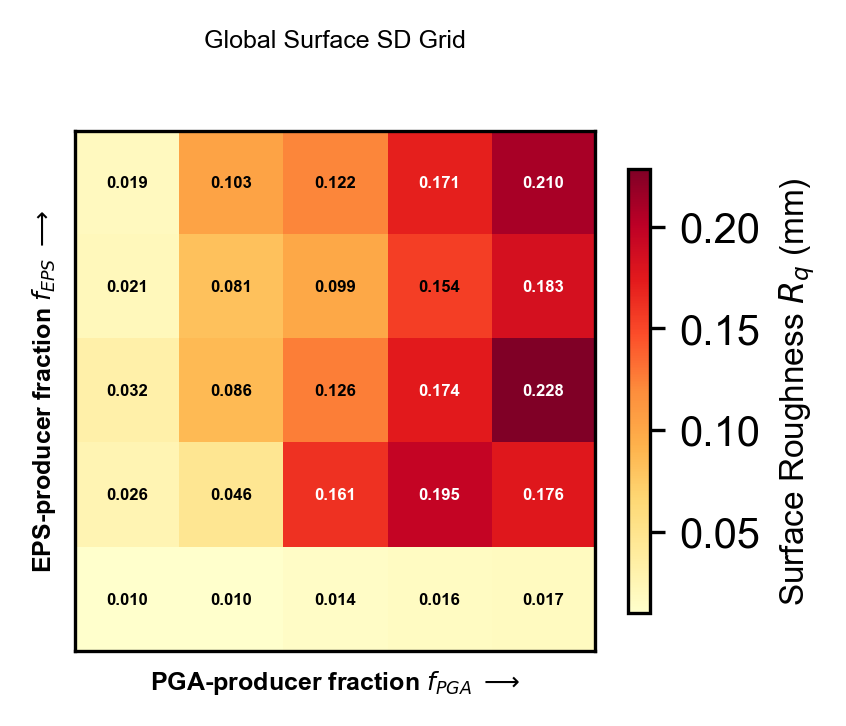

In [14]:
q1 = plot_sd_heatmap(surfaces1_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=1\q1_grid.npy', q1)

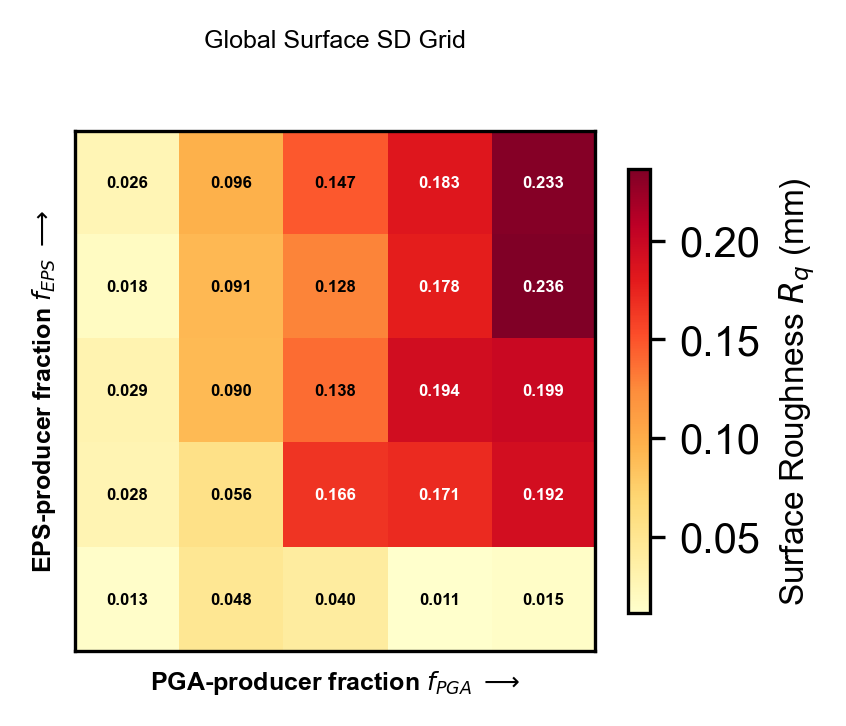

In [15]:
q2 = plot_sd_heatmap(surfaces2_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=2\q2_grid.npy', q2)

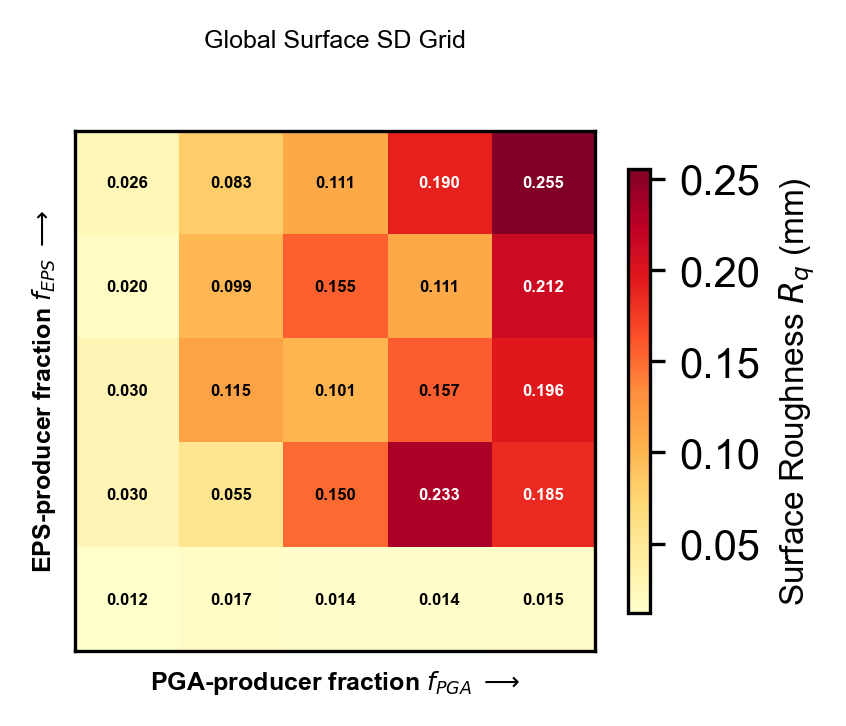

In [16]:
q3 = plot_sd_heatmap(surfaces3_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=3\q3_grid.npy', q3)

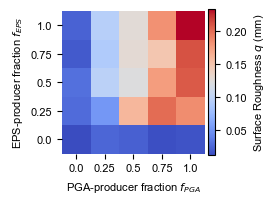

In [21]:
q = [q1, q2, q3]
mean_q_grid = np.mean(q, axis=0)


fig, ax = plt.subplots(figsize=(2.8, 2.4))  
cmap = plt.cm.coolwarm
im = ax.imshow(mean_q_grid, cmap=cmap, origin="upper")
ax.set_ylabel(r"EPS-producer fraction $f_{EPS}$", fontsize=8)
ax.set_xlabel(r"PGA-producer fraction $f_{PGA}$", fontsize=8)
ticks = [0, 1, 2, 3, 4]
tick_labels = [0.0, 0.25, 0.5, 0.75, 1.0]
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=8)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels[::-1], fontsize=8)
for spine in ax.spines.values():
    spine.set_visible(False)

cb = fig.colorbar(im, ax=ax, shrink=0.85, pad=0.02)
cb.set_label(r"Surface Roughness $q$ (mm)", fontsize=8)
cb.ax.tick_params(labelsize=8)
plt.tight_layout()
# plt.savefig(r"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\Wrinkling coefficient q heatmap dome fixed.svg", format ="svg", dpi =1200)
plt.show()

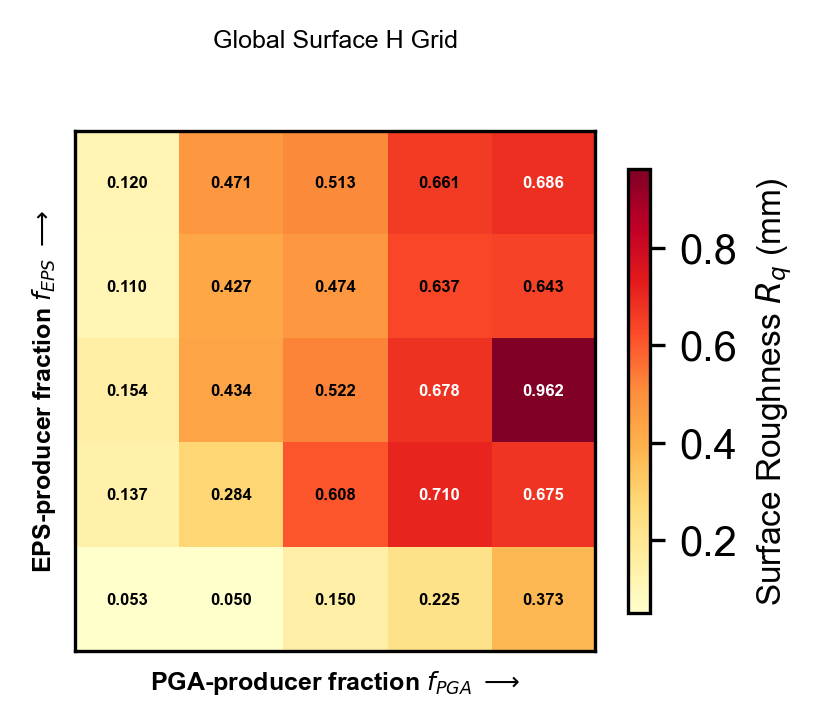

In [17]:
h1 = plot_h_heatmap(surfaces1_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=1\h1_grid.npy', h1)

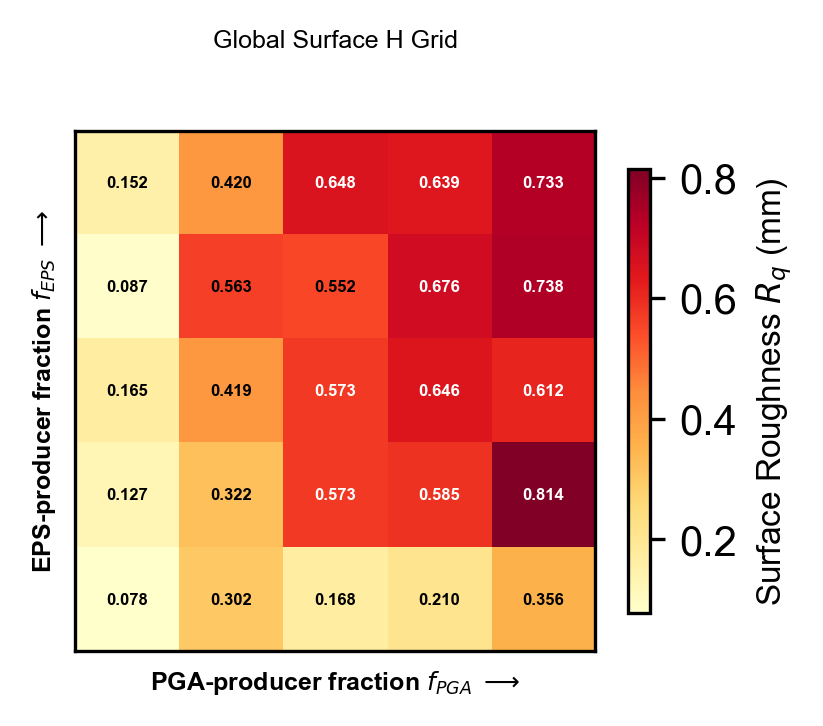

In [18]:
h2 = plot_h_heatmap(surfaces2_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=2\h2_grid.npy', h2)

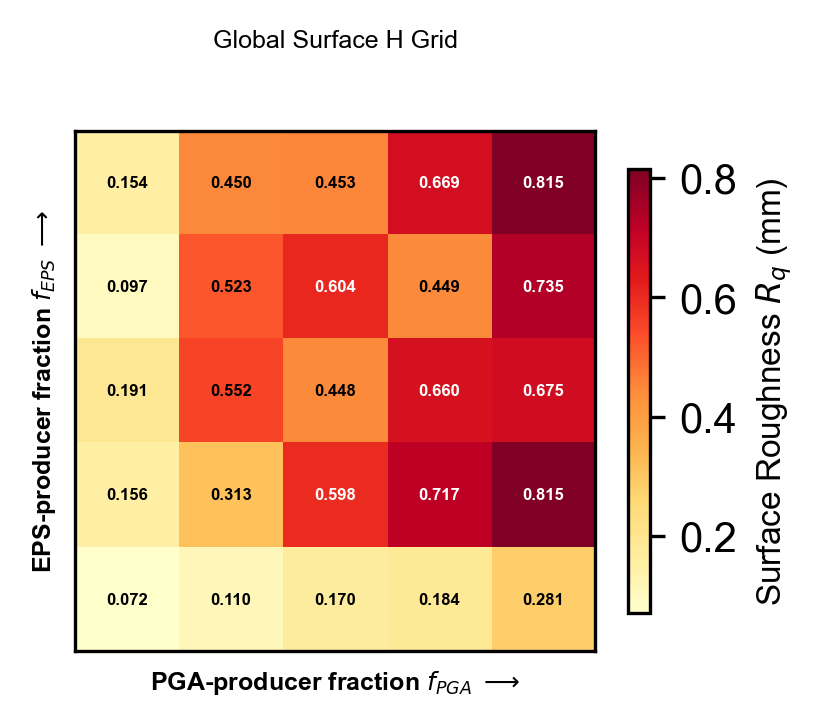

In [19]:
h3 = plot_h_heatmap(surfaces3_reloaded)
# np.save(r'C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\n=3\h3_grid.npy', h3)

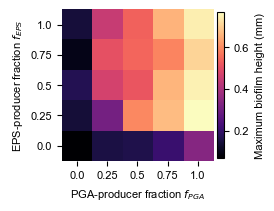

In [20]:
h = [h1, h2, h3]
mean_h_grid = np.mean(h, axis=0)
fig, ax = plt.subplots(figsize=(2.8, 2.4))  
cmap = plt.cm.magma
im = ax.imshow(mean_h_grid, cmap=cmap, origin="upper")
ax.set_ylabel(r"EPS-producer fraction $f_{EPS}$", fontsize=8)
ax.set_xlabel(r"PGA-producer fraction $f_{PGA}$", fontsize=8)
ticks = [0, 1, 2, 3, 4]
tick_labels = [0.0, 0.25, 0.5, 0.75, 1.0]
ax.set_xticks(ticks)
ax.set_xticklabels(tick_labels, fontsize=8)
ax.set_yticks(ticks)
ax.set_yticklabels(tick_labels[::-1], fontsize=8)
for spine in ax.spines.values():
    spine.set_visible(False)

cb = fig.colorbar(im, ax=ax, shrink=0.85, pad=0.02)
cb.set_label(r"Maximum biofilm height (mm)", fontsize=8)
cb.ax.tick_params(labelsize=8)
plt.tight_layout()
# plt.savefig(r"C:\Users\ayantis\Desktop\PhD\Research\Project 1 - Formation of a swelling gel underlies a morphological transition in Bacillus subtilis biofilms\PNAS submission\Revision\Review experiments\Review expt #8\Maximum height heatmap.svg", format = "svg", dpi=1200)
plt.show()